In [ ]:
pip install scikit-surprise

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 13.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.4-cp310-cp310-linux_x86_64.whl size=2357287 sha256=f6c5bd6951e834db7de25e684ef4cd57647254ce09a10819f616ed13c4ea2133
  Stored in directory: /root/.cache/pip/wheels/4b/3f/df/6acbf0a40397d9bf3ff97f582cc22fb9ce66adde75bc71fd54
Successfully built scikit-surprise


In [53]:
pip install lightfm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.4/316.4 kB 22.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lightfm: filename=lightfm-1.17-cp310-cp310-linux_x86_64.whl size=806049 sha256=2472506e6a06fc36fcb48905d48f859c0fb02e4e13b97aee370c20cd11e31955
  Stored in directory: /root/.cache/pip/wheels/4f/9b/7e/0b256f2168511d8fa4dae4fae0200fdbd729eb424a912ad636
Successfully built lightfm


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Flatten, Concatenate, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split as surprise_train_test_split
from surprise import accuracy
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Flatten, Concatenate, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Flatten, Concatenate, Dense
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Flatten, Concatenate, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from surprise import KNNBasic


In [ ]:
el_system = pd.read_csv("ratings_Electronics.csv",
                      names=['userid', 'productid','rating','timestamp', 'unkwn1', 'unkwn2', 'unkwn3'])
el_system.head()

,userid,productid,rating,timestamp,unkwn1,unkwn2,unkwn3
0,AKM1MP6P0OYPR,0132793040,5.0,1365811200,NaN,NaN,NaN
1,A2CX7LUOHB2NDG,0321732944,5.0,1341100800,NaN,NaN,NaN
2,A2NWSAGRHCP8N5,0439886341,1.0,1367193600,NaN,NaN,NaN
3,A2WNBOD3WNDNKT,0439886341,3.0,1374451200,NaN,NaN,NaN
4,A1GI0U4ZRJA8WN,0439886341,1.0,1334707200,NaN,NaN,NaN


In [ ]:
el_system.drop(columns = ['timestamp', 'unkwn1', 'unkwn2', 'unkwn3'], inplace = True)

In [ ]:
# Sample 50% of the data
el_system = el_system.sample(frac=0.3, random_state=42)

# Encode user ids and product ids
user_encoder = LabelEncoder()
product_encoder = LabelEncoder()

el_system['user'] = user_encoder.fit_transform(el_system['userid'])
el_system['product'] = product_encoder.fit_transform(el_system['productid'])

# Use only user, product, and rating
data = el_system[['user', 'product', 'rating']]

# Split the data into training and test sets
train, test = train_test_split(data, test_size=0.2, random_state=42)

# Define a reader object to specify the rating scale
reader = Reader(rating_scale=(1, 5))

# Load the DataFrame into a Surprise dataset
surprise_data = Dataset.load_from_df(data, reader)

# Split the data into training and testing sets using Surprise's train_test_split
trainset, testset = surprise_train_test_split(surprise_data, test_size=0.2, random_state=42)


# **Neural Collaborative Filtering (NCF)**

In [ ]:
# Number of unique users and products
num_users = data['user'].nunique()
num_products = data['product'].nunique()

# Embedding dimensions
embedding_dim = 50

# User embedding
user_input = Input(shape=(1,), name='user_input')
user_embedding = Embedding(input_dim=num_users, output_dim=embedding_dim, name='user_embedding')(user_input)
user_vec = Flatten(name='user_flatten')(user_embedding)

# Product embedding
product_input = Input(shape=(1,), name='product_input')
product_embedding = Embedding(input_dim=num_products, output_dim=embedding_dim, name='product_embedding')(product_input)
product_vec = Flatten(name='product_flatten')(product_embedding)

# Concatenate user and product vectors
concatenated = Concatenate(name='concat')([user_vec, product_vec])

# Dense layers
dense = Dense(128, activation='relu')(concatenated)
dense = Dense(64, activation='relu')(dense)
output = Dense(1, activation='linear')(dense)


# Model
model = Model(inputs=[user_input, product_input], outputs=output)

In [ ]:
model.compile(optimizer='adam', loss='mean_squared_error')

In [ ]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

# Train the model
history = model.fit(
    [train['user'], train['product']],
    train['rating'],
    epochs=5,
    batch_size=64,
    validation_split=0.2
)

Epoch 1/5
23474/23474 [==============================] - 571s 24ms/step - loss: 1.8188 - val_loss: 1.7479
Epoch 2/5
23474/23474 [==============================] - 570s 24ms/step - loss: 0.7706 - val_loss: 2.1697
Epoch 3/5
23474/23474 [==============================] - 567s 24ms/step - loss: 0.4966 - val_loss: 2.2529
Epoch 4/5
23474/23474 [==============================] - 565s 24ms/step - loss: 0.3788 - val_loss: 2.1799
Epoch 5/5
23474/23474 [==============================] - 566s 24ms/step - loss: 0.2771 - val_loss: 2.1760


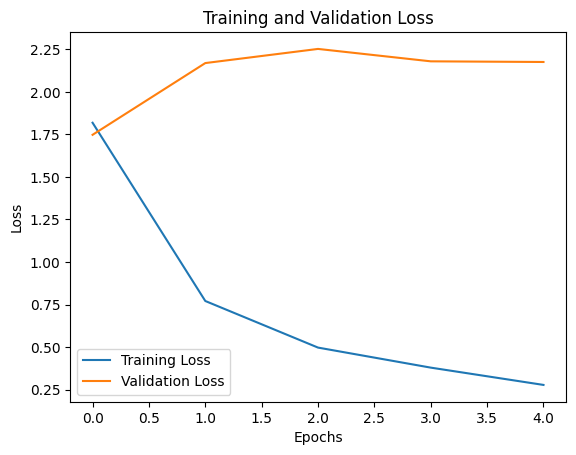

In [59]:
# Assuming `history` is the history object returned by the `model.fit()` method
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.savefig('loss_plot2.png')
plt.legend()

plt.show()

In [ ]:
# Evaluate on test data
loss = model.evaluate([test['user'], test['product']], test['rating'])
print(f'Test Loss: {loss}')

14671/14671 [==============================] - 26s 2ms/step - loss: 2.1770
Test Loss: 2.1769907474517822


In [ ]:
# Predict ratings for test data
predictions = model.predict([test['user'], test['product']])

# Add predictions to the test dataframe
test['predicted_rating'] = predictions

# Display the first few rows
print(test.head())

14671/14671 [==============================] - 21s 1ms/step
            user  product  rating  predicted_rating
303854    589717    12571     5.0          0.976870
547574   1198321    21889     5.0          3.631917
2759157   484404    97679     4.0          4.921879
5690687   658649   195967     5.0          4.790336
1823010  1535826    67103     4.0          4.852788


In [ ]:
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(test['rating'], test['predicted_rating']))
print(f'RMSE: {rmse}')

# Calculate MAE
mae = mean_absolute_error(test['rating'], test['predicted_rating'])
print(f'MAE: {mae}')

RMSE: 1.4754635462405825
MAE: 1.0339201449273296


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
# Define a threshold for considering a rating as positive
threshold = 4.0

# Convert the actual ratings and predicted ratings to binary classifications
y_true = (test['rating'] >= threshold).astype(int)
y_pred = (test['predicted_rating'] >= threshold).astype(int)

# Calculate Precision
precision = precision_score(y_true, y_pred)
print(f'Precision: {precision}')

# Calculate Recall
recall = recall_score(y_true, y_pred)
print(f'Recall: {recall}')

# Calculate F1-Score
f1 = f1_score(y_true, y_pred)
print(f'F1-Score: {f1}')


Precision: 0.785232066315184
Recall: 0.7924860614724804
F1-Score: 0.7888423877700003


# **Singular Value Decomposition (SVD)**

In [ ]:
from surprise.model_selection import train_test_split
from surprise import accuracy
from surprise import SVD


In [ ]:
# Use SVD for collaborative filtering
algo = SVD()


In [ ]:
# Train the algorithm on the trainset
algo.fit(trainset)

# Test the algorithm on the testset
predictions = algo.test(testset)

# Calculate and print RMSE
rmse = accuracy.rmse(predictions)
print(f'RMSE: {rmse}')

RMSE: 1.3140
RMSE: 1.3139986532761159


In [ ]:
# Test the algorithm on the testset
predictions = algo.test(testset)

In [ ]:
# Calculate and print RMSE
rmse = accuracy.rmse(predictions)
print(f'RMSE: {rmse}')

RMSE: 1.3140
RMSE: 1.3139986532761159


In [ ]:
# Calculate and print MAE
mae = accuracy.mae(predictions)
print(f'MAE: {mae}')

MAE:  1.0393
MAE: 1.0392737434665171


In [49]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Define a threshold for positive recommendation
threshold = 3.5

# Convert the actual and predicted ratings to binary labels (1 if >= threshold, else 0)
y_true = [1 if pred.r_ui >= threshold else 0 for pred in predictions]
y_pred = [1 if pred.est >= threshold else 0 for pred in predictions]

# Calculate Precision
precision = precision_score(y_true, y_pred)
print(f'Precision: {precision}')

# Calculate Recall
recall = recall_score(y_true, y_pred)
print(f'Recall: {recall}')

# Calculate F1-Score
f1 = f1_score(y_true, y_pred)
print(f'F1-Score: {f1}')


Precision: 0.7728053649924762
Recall: 0.9316516447885272
F1-Score: 0.8448266929174655


In [51]:
# Predict the rating for a specific user and product
user_id = str(1)  # Use the raw user ID
product_id = str(104)  # Use the raw product ID
predicted_rating = algo.predict(user_id, product_id)
print(f'Predicted rating for user {user_id} and product {product_id}: {predicted_rating.est}')


Predicted rating for user 1 and product 104: 4.011866598220543


In [52]:
# Extract users from the training set
trainset_users = trainset.all_users()
trainset_user_ids = [trainset.to_raw_uid(uid) for uid in trainset_users]
print(f"Users in the training set: {trainset_user_ids}")


Users in the training set: [589717, 1198321, 484404, 658649, 1535826, 819365, 914123, 1224686, 1212406, 8500, 613980, 1118336, 1267809, 793653, 75510, 1309385, 742867, 1574156, 270699, 206966, 965167, 1495861, 1159335, 1072687, 1641525, 87365, 687688, 1419299, 360045, 301112, 1557283, 439725, 722839, 25161, 1587315, 992670, 154692, 778996, 741903, 343714, 377396, 1350726, 899882, 1611449, 1528371, 868945, 409640, 890226, 132010, 845775, 755979, 979382, 1483005, 851110, 428368, 611332, 1485766, 584238, 453206, 892185, 485256, 792595, 1517436, 538800, 5776, 559470, 1298484, 75633, 1092253, 182821, 634165, 1339989, 1109202, 276503, 819258, 569121, 858411, 425735, 643063, 1684551, 920477, 580603, 845873, 1187193, 142616, 1446520, 675601, 828895, 1442035, 851710, 1504277, 365690, 48252, 946674, 994979, 780311, 315654, 1061002, 966152, 487040, 1605350, 118495, 1108871, 155694, 453025, 1367117, 901738, 624081, 994294, 1414871, 617725, 1352495, 1552945, 1284965, 1669846, 702408, 242537, 101255

In [ ]:
# Predict ratings for all unrated items
predictions = [algo.predict(user_id, algo.trainset.to_raw_iid(item_id)) for item_id in unrated_items]


In [ ]:
# Sort predictions by estimated rating
predictions.sort(key=lambda x: x.est, reverse=True)


In [ ]:
# Print top 5 recommendations
top_5_recommendations = predictions[:5]
for pred in top_5_recommendations:
    print(f'Product ID: {pred.iid}, Estimated Rating: {pred.est}')

Product ID: B000BI2180, Estimated Rating: 5
Product ID: B000J43HJ8, Estimated Rating: 5
Product ID: B000VOE466, Estimated Rating: 5
Product ID: B0000B0AD7, Estimated Rating: 5
Product ID: B00006JQ06, Estimated Rating: 5


# **K-Nearest Neighbors (KNN)**


In [ ]:
import pandas as pd
from surprise import Dataset, Reader, KNNBasic
from surprise.model_selection import train_test_split
from surprise import accuracy


In [ ]:
# Use only user, product, and rating

data = el_system[['user', 'product', 'rating']]


# Define a reader and load the data into Surprise
reader = Reader(rating_scale=(1, 5))
surprise_data = Dataset.load_from_df(data, reader)



In [ ]:
# Split the data into train and test sets
trainset, testset = train_test_split(surprise_data, test_size=0.2, random_state=42)

# Use KNNBasic for item-based collaborative filtering
algo = KNNBasic(sim_options={'user_based': False})

In [ ]:
# Train the algorithm on the trainset
algo.fit(trainset)

Computing the msd similarity matrix...
Done computing similarity matrix.


In [ ]:
predictions = algo.test(testset)

In [ ]:
# Calculate and print RMSE
rmse = accuracy.rmse(predictions)
print(f'RMSE: {rmse}')


RMSE: 1.4019
RMSE: 1.4018808347504395


In [ ]:
mae = mean_absolute_error(y_true, y_pred)
print(f'Mean Absolute Error (MAE): {mae}')


Mean Absolute Error (MAE): 1.0953525951380148


In [ ]:
# Define a threshold for considering a recommendation as positive
threshold = 3.5

# Convert predictions to binary classes based on the threshold
y_true = [1 if pred.r_ui >= threshold else 0 for pred in predictions]
y_pred = [1 if pred.est >= threshold else 0 for pred in predictions]

# Calculate Precision
precision = precision_score(y_true, y_pred)
print(f'Precision: {precision}')

# Calculate Recall
recall = recall_score(y_true, y_pred)
print(f'Recall: {recall}')

# Calculate F1-Score
f1 = f1_score(y_true, y_pred)
print(f'F1-Score: {f1}')


Precision: 0.742646271374005
Recall: 0.9900418788369105
F1-Score: 0.8486823318239302


#  **KNNBaseline with Item-Based Collaborative Filtering**

In [57]:
from lightfm import LightFM
from lightfm.datasets import fetch_movielens
from lightfm.evaluation import precision_at_k, recall_at_k
from sklearn.metrics import mean_squared_error, mean_absolute_error, f1_score
import numpy as np

# Fetch the dataset (this is just an example, you would use your own dataset)
data = fetch_movielens(min_rating=3.5)

# Instantiate the model with BPR loss function
model = LightFM(loss='bpr')

# Fit the model on the training data
model.fit(data['train'], epochs=30, num_threads=2)

In [58]:

# Generate predictions for test data
test_predictions = model.predict(data['test'].tocoo().row, data['test'].tocoo().col)

# Extract the true labels
test_labels = data['test'].tocoo().data

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(test_labels, test_predictions))
print(f'RMSE: {rmse}')

# Calculate MAE
mae = mean_absolute_error(test_labels, test_predictions)
print(f'MAE: {mae}')

# Calculate Precision@K and Recall@K
precision = precision_at_k(model, data['test'], k=5).mean()
recall = recall_at_k(model, data['test'], k=5).mean()

print(f'Precision@K: {precision}')
print(f'Recall@K: {recall}')


RMSE: 6.293162835749381
MAE: 5.915621107897834
Precision@K: 0.06124196574091911
Recall@K: 0.05374137520818463


In [56]:
# For F1-score, convert predictions and labels to binary (using threshold)
threshold = 4.0
y_pred_binary = (test_predictions >= threshold).astype(int)
y_true_binary = (test_labels >= threshold).astype(int)

# Calculate F1-score
f1 = f1_score(y_true_binary, y_pred_binary)
print(f'F1-Score: {f1}')

F1-Score: 0.0
